# Sentiment Analysis

In [1]:
#import dependancies
from pathlib import Path
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import requests
import json
from pprint import pprint
from config import api_key

In [2]:
#Read in csv files

nyse_price_csv = Path("Resources/nyse_prices-split-adjusted.csv")

nyse_sec_csv = Path("Resources/nyse_securities.csv")

spx_csv = Path("Resources/SPX.csv")

#create df's
nyse_price_df = pd.read_csv(nyse_price_csv)
nyse_sec_df = pd.read_csv(nyse_sec_csv)
spx_df = pd.read_csv(spx_csv)


In [3]:
#Preview NYSE price data
nyse_price_df.head()

,date,symbol,open,close,low,high,volume
0,2016-01-05,WLTW,123.430000,125.839996,122.309998,126.250000,2163600.0
1,2016-01-06,WLTW,125.239998,119.980003,119.940002,125.540001,2386400.0
2,2016-01-07,WLTW,116.379997,114.949997,114.930000,119.739998,2489500.0
3,2016-01-08,WLTW,115.480003,116.620003,113.500000,117.440002,2006300.0
4,2016-01-11,WLTW,117.010002,114.970001,114.089996,117.330002,1408600.0


In [4]:
#Preview NYSE securities data
nyse_sec_df.head()

,Ticker symbol,Security,SEC filings,GICS Sector,GICS Sub Industry,Address of Headquarters,Date first added,CIK
0,MMM,3M Company,reports,Industrials,Industrial Conglomerates,"St. Paul, Minnesota",NaN,66740
1,ABT,Abbott Laboratories,reports,Health Care,Health Care Equipment,"North Chicago, Illinois",1964-03-31,1800
2,ABBV,AbbVie,reports,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152
3,ACN,Accenture plc,reports,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373
4,ATVI,Activision Blizzard,reports,Information Technology,Home Entertainment Software,"Santa Monica, California",2015-08-31,718877


In [5]:
#Preview NYSE SP500 data
spx_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1927-12-30,17.660000,17.660000,17.660000,17.660000,17.660000,0
1,1928-01-03,17.760000,17.760000,17.760000,17.760000,17.760000,0
2,1928-01-04,17.719999,17.719999,17.719999,17.719999,17.719999,0
3,1928-01-05,17.549999,17.549999,17.549999,17.549999,17.549999,0
4,1928-01-06,17.660000,17.660000,17.660000,17.660000,17.660000,0


# Data Cleaning

In [6]:
# Lets look for null values in the nyse price dataset
nyse_price_df.isna().sum()
#Lets change symbol column to Ticker Symbol for merging
nyse_price_df["Ticker symbol"] = nyse_price_df["symbol"]
# drop old symbol column
nyse_price_df= nyse_price_df.drop(["symbol"],axis = 1)
#set index to ticker symbol
#nyse_price_df = nyse_price_df.set_index(nyse_price_df["Ticker symbol"])
nyse_price_df.head()

,date,open,close,low,high,volume,Ticker symbol
0,2016-01-05,123.430000,125.839996,122.309998,126.250000,2163600.0,WLTW
1,2016-01-06,125.239998,119.980003,119.940002,125.540001,2386400.0,WLTW
2,2016-01-07,116.379997,114.949997,114.930000,119.739998,2489500.0,WLTW
3,2016-01-08,115.480003,116.620003,113.500000,117.440002,2006300.0,WLTW
4,2016-01-11,117.010002,114.970001,114.089996,117.330002,1408600.0,WLTW


In [7]:
# Lets look for null values in the nyse securities dataset
nyse_sec_df.isna().sum() #198 na values in the date first added column

#drop Date first added and Address of Headquarters columns because we won't be needing them
nyse_sec_clean = nyse_sec_df.drop(["Date first added","Address of Headquarters"],axis = 1)
#Set index as Ticker symbol
#nyse_sec_clean = nyse_sec_clean.set_index(nyse_sec_clean["Ticker symbol"])
nyse_sec_clean.head()


,Ticker symbol,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
0,MMM,3M Company,reports,Industrials,Industrial Conglomerates,66740
1,ABT,Abbott Laboratories,reports,Health Care,Health Care Equipment,1800
2,ABBV,AbbVie,reports,Health Care,Pharmaceuticals,1551152
3,ACN,Accenture plc,reports,Information Technology,IT Consulting & Other Services,1467373
4,ATVI,Activision Blizzard,reports,Information Technology,Home Entertainment Software,718877


In [8]:
# Lets look for null values in the SP500 dataset
spx_df.isna().sum() ## all good no null values

spx_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1927-12-30,17.660000,17.660000,17.660000,17.660000,17.660000,0
1,1928-01-03,17.760000,17.760000,17.760000,17.760000,17.760000,0
2,1928-01-04,17.719999,17.719999,17.719999,17.719999,17.719999,0
3,1928-01-05,17.549999,17.549999,17.549999,17.549999,17.549999,0
4,1928-01-06,17.660000,17.660000,17.660000,17.660000,17.660000,0


In [9]:
# Lets merge the NYSE data sets together based on ticker symbol
combined_df = nyse_price_df.merge(nyse_sec_clean, on = "Ticker symbol",how ="inner")

combined_df = combined_df.set_index("Ticker symbol")

combined_df

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
WLTW,2016-01-05,123.430000,125.839996,122.309998,126.250000,2163600.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-06,125.239998,119.980003,119.940002,125.540001,2386400.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-07,116.379997,114.949997,114.930000,119.739998,2489500.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-08,115.480003,116.620003,113.500000,117.440002,2006300.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-11,117.010002,114.970001,114.089996,117.330002,1408600.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
...,...,...,...,...,...,...,...,...,...,...,...
FTV,2016-12-23,54.330002,54.509998,53.770000,54.759998,511900.0,Fortive Corp,reports,Industrials,Industrial Machinery,1659166
FTV,2016-12-27,54.750000,54.459999,54.110001,54.840000,386200.0,Fortive Corp,reports,Industrials,Industrial Machinery,1659166
FTV,2016-12-28,54.660000,53.750000,53.470001,54.660000,540400.0,Fortive Corp,reports,Industrials,Industrial Machinery,1659166


In [21]:
# Add daily price change column (just the change during the day's trading) and per cent change
combined_df.insert(3, "change", (combined_df['close'] - combined_df['open']))
combined_df.insert(4, "% change", (combined_df['close'] - combined_df['open'])/combined_df['open']*100)
change_df = combined_df
change_df.head()

,date,open,close,change,% change,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,,,
WLTW,2016-01-05,123.430000,125.839996,2.409996,1.952520,122.309998,126.250000,2163600.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-06,125.239998,119.980003,-5.259995,-4.199932,119.940002,125.540001,2386400.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-07,116.379997,114.949997,-1.430000,-1.228733,114.930000,119.739998,2489500.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-08,115.480003,116.620003,1.140000,0.987184,113.500000,117.440002,2006300.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-11,117.010002,114.970001,-2.040001,-1.743442,114.089996,117.330002,1408600.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536


In [22]:
# List the sectors
sector_array = combined_df['GICS Sector'].unique()
print(sector_array)

['Financials' 'Health Care' 'Industrials' 'Consumer Discretionary'
 'Information Technology' 'Consumer Staples' 'Utilities' 'Materials'
 'Real Estate' 'Energy' 'Telecommunications Services']


In [23]:
# check type of date column
change_df.dtypes

date                 datetime64[ns]
open                        float64
close                       float64
change                      float64
% change                    float64
low                         float64
high                        float64
volume                      float64
Security                     object
SEC filings                  object
GICS Sector                  object
GICS Sub Industry            object
CIK                           int64
dtype: object

In [24]:
change_df['date'] = pd.to_datetime(change_df['date'])
change_df.head()

,date,open,close,change,% change,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,,,
WLTW,2016-01-05,123.430000,125.839996,2.409996,1.952520,122.309998,126.250000,2163600.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-06,125.239998,119.980003,-5.259995,-4.199932,119.940002,125.540001,2386400.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-07,116.379997,114.949997,-1.430000,-1.228733,114.930000,119.739998,2489500.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-08,115.480003,116.620003,1.140000,0.987184,113.500000,117.440002,2006300.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536
WLTW,2016-01-11,117.010002,114.970001,-2.040001,-1.743442,114.089996,117.330002,1408600.0,Willis Towers Watson,reports,Financials,Insurance Brokers,1140536


In [25]:
change_sorted_df = change_df.sort_values(by='date')
change_sorted_df

,date,open,close,change,% change,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,,,
AN,2010-01-04,19.459999,19.270000,-0.189999,-0.976357,19.209999,19.620001,1650400.0,AutoNation Inc,reports,Consumer Discretionary,Specialty Stores,350698
PXD,2010-01-04,49.380001,50.980000,1.599999,3.240176,49.380001,51.150002,1524100.0,Pioneer Natural Resources,reports,Energy,Oil & Gas Exploration & Production,1038357
MHK,2010-01-04,48.270000,48.310001,0.040001,0.082869,47.950001,48.820000,497000.0,Mohawk Industries,reports,Consumer Discretionary,Home Furnishings,851968
IFF,2010-01-04,41.509998,42.009998,0.500000,1.204529,41.500000,42.020000,286000.0,Intl Flavors & Fragrances,reports,Materials,Specialty Chemicals,51253
CELG,2010-01-04,28.320000,27.870001,-0.449999,-1.588978,27.665001,28.320000,4832000.0,Celgene Corp.,reports,Health Care,Biotechnology,816284
...,...,...,...,...,...,...,...,...,...,...,...,...,...
FOX,2016-12-30,27.500000,27.250000,-0.250000,-0.909091,27.080000,27.520000,2885000.0,Twenty-First Century Fox Class B,reports,Consumer Discretionary,Publishing,1308161
FOXA,2016-12-30,28.290001,28.040001,-0.250000,-0.883704,27.920000,28.370001,6161200.0,Twenty-First Century Fox Class A,reports,Consumer Discretionary,Publishing,1308161
FRT,2016-12-30,139.970001,142.110001,2.140000,1.528899,139.740005,142.809998,440000.0,Federal Realty Investment Trust,reports,Real Estate,Retail REITs,34903


In [26]:
# Get unique dates as x values
xvals = change_sorted_df['date'].unique()
print(len(xvals))

1762


In [27]:
# Get daily sector change by average stock change across the sector for each sector and save in sector yvals arrays
# 'Financials' 'Health Care' 'Industrials' 'Consumer Discretionary' 'Information Technology' 'Consumer Staples' 'Utilities'
# 'Materials' 'Real Estate' 'Energy' 'Telecommunications Services'
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
financials_yvals = []
health_care_yvals = []
industrials_yvals = []
consumer_discretionary_yvals = []
information_technology_yvals = []
consumer_staples_yvals = []
utilities_yvals = []
materials_yvals = []
real_estate_yvals = []
energy_yvals = []
telecommunications_services_yvals = []
for date in xvals:
    yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Financials'),:].mean()
    financials_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Health Care'),:].mean()
#     health_care_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Industrials'),:].mean()
#     industrials_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Consumer Discretionary'),:].mean()
#     consumer_discretionary_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Information Technology'),:].mean()
#     information_technology_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Consumer Staples'),:].mean()
#     consumer_staples_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Utilities'),:].mean()
#     utilities_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Materials'),:].mean()
#     materials_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Real Estate'),:].mean()
#     real_estate_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Energy'),:].mean()
#     energy_yvals.append(yval)
# for date in xvals:
#     yval = change_sorted_df.loc[(change_sorted_df['date']==date) & (change_sorted_df['GICS Sector']=='Telecommunications Services'),:].mean()
#     telecommunications_services_yvals.append(yval)


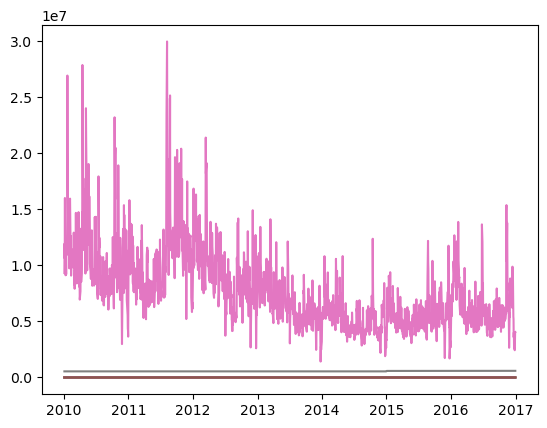

In [28]:
#plot the graph
plt.plot(xvals, financials_yvals)
plt.show()

In [38]:
real_estate_df = combined_df.loc[combined_df['GICS Sector']=="Real Estate",:]
real_estate_df

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
AMT,2010-01-04,43.490002,43.459999,43.279999,43.889999,2750500.0,American Tower Corp A,reports,Real Estate,Specialized REITs,1053507
AMT,2010-01-05,43.500000,44.180000,43.400002,44.250000,2575800.0,American Tower Corp A,reports,Real Estate,Specialized REITs,1053507
AMT,2010-01-06,44.240002,44.410000,43.770000,44.560001,3215300.0,American Tower Corp A,reports,Real Estate,Specialized REITs,1053507
AMT,2010-01-07,44.430000,44.290001,44.009998,44.570000,2615000.0,American Tower Corp A,reports,Real Estate,Specialized REITs,1053507
AMT,2010-01-08,44.380001,44.380001,44.009998,44.570000,1934600.0,American Tower Corp A,reports,Real Estate,Specialized REITs,1053507
...,...,...,...,...,...,...,...,...,...,...,...
AIV,2016-12-23,44.529999,44.740002,44.480000,44.910000,796400.0,Apartment Investment & Mgmt,reports,Real Estate,REITs,922864
AIV,2016-12-27,44.720001,44.310001,44.240002,44.939999,1312600.0,Apartment Investment & Mgmt,reports,Real Estate,REITs,922864
AIV,2016-12-28,44.360001,44.230000,44.000000,44.450001,810000.0,Apartment Investment & Mgmt,reports,Real Estate,REITs,922864


In [37]:
materials_df = combined_df.loc[combined_df['GICS Sector']=="Materials",:]
materials_df

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
ALB,2010-01-04,36.910000,38.090000,36.900002,38.240002,712900.0,Albemarle Corp,reports,Materials,Specialty Chemicals,915913
ALB,2010-01-05,38.700001,38.020000,37.599998,38.700001,398900.0,Albemarle Corp,reports,Materials,Specialty Chemicals,915913
ALB,2010-01-06,37.959999,38.090000,37.889999,38.480000,717200.0,Albemarle Corp,reports,Materials,Specialty Chemicals,915913
ALB,2010-01-07,38.029999,37.820000,37.799999,38.169998,603700.0,Albemarle Corp,reports,Materials,Specialty Chemicals,915913
ALB,2010-01-08,37.660000,38.389999,37.660000,38.570000,759000.0,Albemarle Corp,reports,Materials,Specialty Chemicals,915913
...,...,...,...,...,...,...,...,...,...,...,...
WRK,2016-12-23,51.369999,51.889999,51.369999,51.910000,694500.0,WestRock Company,reports,Materials,Paper Packaging,1636023
WRK,2016-12-27,52.130001,52.270000,51.880001,52.410000,466500.0,WestRock Company,reports,Materials,Paper Packaging,1636023
WRK,2016-12-28,52.590000,51.529999,51.458000,52.590000,909000.0,WestRock Company,reports,Materials,Paper Packaging,1636023


In [36]:
utilities_df = combined_df.loc[combined_df['GICS Sector']=="Utilities",:]
utilities_df

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
AEE,2010-01-04,28.030001,27.760000,27.690001,28.270000,1299300.0,Ameren Corp,reports,Utilities,MultiUtilities,1002910
AEE,2010-01-05,27.770000,27.650000,27.410000,27.840000,1422200.0,Ameren Corp,reports,Utilities,MultiUtilities,1002910
AEE,2010-01-06,27.610001,27.459999,27.350000,27.889999,1880300.0,Ameren Corp,reports,Utilities,MultiUtilities,1002910
AEE,2010-01-07,27.469999,27.200001,27.049999,27.469999,936900.0,Ameren Corp,reports,Utilities,MultiUtilities,1002910
AEE,2010-01-08,27.219999,27.010000,26.830000,27.219999,954100.0,Ameren Corp,reports,Utilities,MultiUtilities,1002910
...,...,...,...,...,...,...,...,...,...,...,...
XEL,2016-12-23,40.790001,40.669998,40.520000,40.860001,898800.0,Xcel Energy Inc,reports,Utilities,MultiUtilities,72903
XEL,2016-12-27,40.570000,40.730000,40.480000,40.840000,914100.0,Xcel Energy Inc,reports,Utilities,MultiUtilities,72903
XEL,2016-12-28,40.720001,40.290001,40.250000,40.730000,1040900.0,Xcel Energy Inc,reports,Utilities,MultiUtilities,72903


In [35]:
consumer_staples_df = combined_df.loc[combined_df['GICS Sector']=="Consumer Staples",:]
consumer_staples_df

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
ADM,2010-01-04,31.480000,31.469999,31.330000,31.840000,3472500.0,Archer-Daniels-Midland Co,reports,Consumer Staples,Agricultural Products,7084
ADM,2010-01-05,31.549999,31.639999,31.400000,31.770000,3458700.0,Archer-Daniels-Midland Co,reports,Consumer Staples,Agricultural Products,7084
ADM,2010-01-06,31.600000,31.559999,31.430000,31.889999,3745800.0,Archer-Daniels-Midland Co,reports,Consumer Staples,Agricultural Products,7084
ADM,2010-01-07,31.549999,31.230000,31.049999,31.700001,7232100.0,Archer-Daniels-Midland Co,reports,Consumer Staples,Agricultural Products,7084
ADM,2010-01-08,31.120001,30.840000,30.520000,31.190001,6264700.0,Archer-Daniels-Midland Co,reports,Consumer Staples,Agricultural Products,7084
...,...,...,...,...,...,...,...,...,...,...,...
KHC,2016-12-23,87.099998,87.570000,86.959999,87.620003,2484700.0,Kraft Heinz Co,reports,Consumer Staples,Packaged Foods & Meats,1545158
KHC,2016-12-27,87.660004,87.580002,87.300003,88.080002,1990000.0,Kraft Heinz Co,reports,Consumer Staples,Packaged Foods & Meats,1545158
KHC,2016-12-28,87.500000,87.309998,87.029999,87.769997,1361400.0,Kraft Heinz Co,reports,Consumer Staples,Packaged Foods & Meats,1545158


In [34]:
information_technology_df = combined_df.loc[combined_df['GICS Sector']=="Information Technology",:]
information_technology_df

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
AAPL,2010-01-04,30.490000,30.572857,30.340000,30.642857,123432400.0,Apple Inc.,reports,Information Technology,Computer Hardware,320193
AAPL,2010-01-05,30.657143,30.625713,30.464285,30.798571,150476200.0,Apple Inc.,reports,Information Technology,Computer Hardware,320193
AAPL,2010-01-06,30.625713,30.138571,30.107143,30.747143,138040000.0,Apple Inc.,reports,Information Technology,Computer Hardware,320193
AAPL,2010-01-07,30.250000,30.082857,29.864286,30.285715,119282800.0,Apple Inc.,reports,Information Technology,Computer Hardware,320193
AAPL,2010-01-08,30.042856,30.282858,29.865715,30.285715,111902700.0,Apple Inc.,reports,Information Technology,Computer Hardware,320193
...,...,...,...,...,...,...,...,...,...,...,...
CSRA,2016-12-23,31.930000,31.889999,31.520000,31.930000,371400.0,CSRA Inc.,reports,Information Technology,IT Consulting & Other Services,1646383
CSRA,2016-12-27,31.940001,32.020000,31.920000,32.110001,892500.0,CSRA Inc.,reports,Information Technology,IT Consulting & Other Services,1646383
CSRA,2016-12-28,31.980000,31.690001,31.570000,32.220001,816800.0,CSRA Inc.,reports,Information Technology,IT Consulting & Other Services,1646383


In [33]:
consumer_discretionary_df = combined_df.loc[combined_df['GICS Sector']=="Consumer Discretionary",:]
consumer_discretionary_df

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
AAP,2010-01-04,40.700001,40.380001,40.360001,41.040001,1701700.0,Advance Auto Parts,reports,Consumer Discretionary,Automotive Retail,1158449
AAP,2010-01-05,40.299999,40.139999,39.720001,40.310001,1932400.0,Advance Auto Parts,reports,Consumer Discretionary,Automotive Retail,1158449
AAP,2010-01-06,40.049999,40.490002,40.049999,40.779999,1406200.0,Advance Auto Parts,reports,Consumer Discretionary,Automotive Retail,1158449
AAP,2010-01-07,39.549999,40.480000,39.549999,40.540001,1256800.0,Advance Auto Parts,reports,Consumer Discretionary,Automotive Retail,1158449
AAP,2010-01-08,40.250000,40.639999,40.110001,40.820000,960300.0,Advance Auto Parts,reports,Consumer Discretionary,Automotive Retail,1158449
...,...,...,...,...,...,...,...,...,...,...,...
NWSA,2016-12-23,11.740000,11.730000,11.650000,11.770000,1368800.0,News Corp. Class A,reports,Consumer Discretionary,Publishing,1564708
NWSA,2016-12-27,11.740000,11.910000,11.710000,11.910000,1504300.0,News Corp. Class A,reports,Consumer Discretionary,Publishing,1564708
NWSA,2016-12-28,11.910000,11.690000,11.670000,11.920000,2014700.0,News Corp. Class A,reports,Consumer Discretionary,Publishing,1564708


In [32]:
industrials_df = combined_df.loc[combined_df['GICS Sector']=="Industrials",:]
industrials_df

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
AAL,2010-01-04,4.840000,4.770000,4.660000,4.940000,9837300.0,American Airlines Group,reports,Industrials,Airlines,6201
AAL,2010-01-05,4.790000,5.310000,4.710000,5.370000,25212000.0,American Airlines Group,reports,Industrials,Airlines,6201
AAL,2010-01-06,5.190000,5.090000,5.000000,5.380000,16597900.0,American Airlines Group,reports,Industrials,Airlines,6201
AAL,2010-01-07,5.060000,5.240000,5.050000,5.430000,14033400.0,American Airlines Group,reports,Industrials,Airlines,6201
AAL,2010-01-08,5.270000,5.140000,5.060000,5.430000,12760000.0,American Airlines Group,reports,Industrials,Airlines,6201
...,...,...,...,...,...,...,...,...,...,...,...
FTV,2016-12-23,54.330002,54.509998,53.770000,54.759998,511900.0,Fortive Corp,reports,Industrials,Industrial Machinery,1659166
FTV,2016-12-27,54.750000,54.459999,54.110001,54.840000,386200.0,Fortive Corp,reports,Industrials,Industrial Machinery,1659166
FTV,2016-12-28,54.660000,53.750000,53.470001,54.660000,540400.0,Fortive Corp,reports,Industrials,Industrial Machinery,1659166


In [30]:
health_care_df = combined_df.loc[combined_df['GICS Sector']=="Health Care",:]
health_care_df

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
A,2010-01-04,22.453504,22.389128,22.267525,22.625180,3815500.0,Agilent Technologies Inc,reports,Health Care,Health Care Equipment,1090872
A,2010-01-05,22.324749,22.145923,22.002861,22.331903,4186000.0,Agilent Technologies Inc,reports,Health Care,Health Care Equipment,1090872
A,2010-01-06,22.067240,22.067240,22.002861,22.174536,3243700.0,Agilent Technologies Inc,reports,Health Care,Health Care Equipment,1090872
A,2010-01-07,22.017168,22.038626,21.816881,22.045780,3095100.0,Agilent Technologies Inc,reports,Health Care,Health Care Equipment,1090872
A,2010-01-08,21.917024,22.031474,21.745350,22.067240,3733900.0,Agilent Technologies Inc,reports,Health Care,Health Care Equipment,1090872
...,...,...,...,...,...,...,...,...,...,...,...
EVHC,2016-12-23,64.620003,65.339996,64.620003,65.559998,609200.0,Envision Healthcare Corp,reports,Health Care,Health Care Services,895930
EVHC,2016-12-27,65.739998,65.779999,65.290001,66.650002,723000.0,Envision Healthcare Corp,reports,Health Care,Health Care Services,895930
EVHC,2016-12-28,65.059998,64.610001,64.290001,65.730003,1162300.0,Envision Healthcare Corp,reports,Health Care,Health Care Services,895930


In [46]:
financials_df = combined_df.loc[combined_df['GICS Sector']=="Financials",:]
financials_df.sort_values('date')

,date,open,close,low,high,volume,Security,SEC filings,GICS Sector,GICS Sub Industry,CIK
Ticker symbol,,,,,,,,,,,
CME,2010-01-04,67.695999,68.482002,67.503998,68.695999,2660500.0,CME Group Inc.,reports,Financials,Financial Exchanges & Data,1156375
JPM,2010-01-04,41.790001,42.849998,41.669998,42.990002,35460500.0,JPMorgan Chase & Co.,reports,Financials,Banks,19617
BAC,2010-01-04,15.240000,15.690000,15.120000,15.750000,180845200.0,Bank of America Corp,reports,Financials,Banks,70858
GS,2010-01-04,170.050003,173.080002,169.509995,174.250000,9135000.0,Goldman Sachs Group,reports,Financials,Investment Banking & Brokerage,886982
NTRS,2010-01-04,52.090000,52.529999,52.090000,52.750000,1967200.0,Northern Trust Corp.,reports,Financials,Asset Management & Custody Banks,73124
...,...,...,...,...,...,...,...,...,...,...,...
CME,2016-12-30,116.070000,115.349998,114.900002,116.480003,898300.0,CME Group Inc.,reports,Financials,Financial Exchanges & Data,1156375
CMA,2016-12-30,68.300003,68.110001,67.739998,68.419998,1031900.0,Comerica Inc.,reports,Financials,Regional Banks,28412
CINF,2016-12-30,75.870003,75.750000,75.519997,75.989998,471600.0,Cincinnati Financial,reports,Financials,Property & Casualty Insurance,20286


In [28]:
for each date in date_array:
    

AttributeError: 'Series' object has no attribute 'sort'

In [12]:
# Save config information
url = "https://api.nytimes.com/svc/archive/v1/"
year = "2016"
month = "1"


# Build query URL
query_url = url + year + "/" + month + ".json?api-key=" + api_key

In [13]:
# Get NYT headline data
NYT_response = requests.get(query_url).json()

# Get the temperature from the response
pprint(NYT_response)

{'copyright': 'Copyright (c) 2020 The New York Times Company. All Rights '
              'Reserved.',
 'response': {'docs': [{'_id': 'nyt://article/df95e7d6-e02e-5b2b-a7f4-0c4e19a8276c',
                        'abstract': 'Bill Cosby came close to escaping sexual '
                                    'assault charges. How many others do?',
                        'byline': {'organization': None,
                                   'original': 'By Jill Filipovic',
                                   'person': [{'firstname': 'Jill',
                                               'lastname': 'Filipovic',
                                               'middlename': None,
                                               'organization': '',
                                               'qualifier': None,
                                               'rank': 1,
                                               'role': 'reported',
                                               'title': None}]},
  

                                       {'caption': None,
                                        'credit': None,
                                        'crop_name': 'thumbLarge',
                                        'height': 150,
                                        'legacy': {},
                                        'rank': 0,
                                        'subType': 'thumbLarge',
                                        'subtype': 'thumbLarge',
                                        'type': 'image',
                                        'url': 'images/2016/01/02/nyregion/02NEEDIESTBIKOV/02NEEDIESTBIKOV-thumbLarge.jpg',
                                        'width': 150}],
                        'news_desk': 'Metro',
                        'print_page': '12',
                        'print_section': 'A',
                        'pub_date': '2016-01-02T01:30:00+0000',
                        'section_name': 'New York',
                        'snippet': 'Aleks

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'major': 'N',
                                      'name': 'subject',
                                      'rank': 2,
                                      'value': 'Education (K-12)'},
                                     {'major': 'N',
                                      'name': 'subject',
                                      'rank': 3,
                                      'value': 'Graduation Rates'},
                                     {'major': 'N',
                                      'name': 'subject',
                                      'rank': 4,
                                      'value': 'Blacks'},
                                     {'major': 'N',
                                      'name': 'subject',
                                      'rank': 5,
                                      'value': 'Black People'},
                                     {'major': 'N',
                                      'name': 'subject',
                                      

                                      'value': 'New York City'},
                                     {'major': 'N',
                                      'name': 'glocations',
                                      'rank': 11,
                                      'value': 'New York State'}],
                        'lead_paragraph': 'Gov. Andrew M. Cuomo entreated New '
                                          'Yorkers last week to “think big” '
                                          'again, invoking Robert Moses, New '
                                          'York’s take-no-prisoners planning '
                                          'czar of the 20th century.',
                        'multimedia': [{'caption': None,
                                        'credit': None,
                                        'crop_name': 'articleLarge',
                                        'height': 434,
                                        'legacy': {'xlarge': 'images/2016/01/13/ar

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'New York-Presbyterian '
                                               'Hospital'},
                                     {'major': 'N',
                                      'name': 'organizations',
                                      'rank': 7,
                                      'value': 'Smithsonian Institution'},
                                     {'major': 'N',
                                      'name': 'organizations',
                                      'rank': 8,
                                      'value': 'Smithsonian National Museum of '
                                               'Natural History'}],
                        'lead_paragraph': 'David H. Koch, a philanthropist who '
                                          'has given millions of dollars to '
                                          'the American Museum of Natural '
                                          'History in New York but whose '
                                          'businesses

                       {'_id': 'nyt://article/9cc80511-2a68-56f0-9e64-78473ead2f2a',
                        'abstract': 'A Swedish man’s confession on state '
                                    'television is the latest case of China '
                                    'broadcasting self-criticism as propaganda '
                                    'for an audience of hundreds of millions.',
                        'byline': {'organization': None,
                                   'original': 'By Edward Wong',
                                   'person': [{'firstname': 'Edward',
                                               'lastname': 'Wong',
                                               'middlename': None,
                                               'organization': '',
                                               'qualifier': None,
                                               'rank': 1,
                                               'role': 'reported',
                 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'caption': None,
                                        'credit': None,
                                        'crop_name': 'articleLarge',
                                        'height': 442,
                                        'legacy': {'xlarge': 'images/2016/01/29/sports/29ARATONweb1/29ARATONweb1-articleLarge.jpg',
                                                   'xlargeheight': 442,
                                                   'xlargewidth': 600},
                                        'rank': 0,
                                        'subType': 'xlarge',
                                        'subtype': 'xlarge',
                                        'type': 'image',
                                        'url': 'images/2016/01/29/sports/29ARATONweb1/29ARATONweb1-articleLarge.jpg',
                                        'width': 600},
                                       {'caption': None,
                                        'credit': None,
          

                       {'_id': 'nyt://article/29fbded5-dae2-563d-8a26-9712cf178be9',
                        'abstract': 'Following is a transcript of the '
                                    'Republican “undercard” debate held '
                                    'Thursday in Des Moines, as recorded by '
                                    'the Federal News Service.',
                        'byline': {'organization': 'The New York Times',
                                   'original': 'By The New York Times',
                                   'person': []},
                        'document_type': 'article',
                        'headline': {'content_kicker': None,
                                     'kicker': None,
                                     'main': 'Transcript of the Preliminary '
                                             'G.O.P. Presidential Debate',
                                     'name': None,
                                     'print_headline': '',
  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [14]:
#initialize column lists for NYT_df
headline=[]
news_desk = []
section = []
date = []
# print(NYT_response['response']['docs'][1])
for i in range(len(NYT_response['response']['docs'])):
    headline.append(NYT_response['response']['docs'][i]['headline']['print_headline'])
    news_desk.append(NYT_response['response']['docs'][i]['news_desk'])
    section.append(NYT_response['response']['docs'][i]['section_name'])
    date.append(NYT_response['response']['docs'][i]['pub_date'])

# print(Headline)
# len(NYT_response['response']['docs'])

In [16]:
#create NYT dataframe
NYT_dict = {
    "headline": headline,
    "News Desk": news_desk,
    "Section": section,
    "Date": date
}
NYT_df = pd.DataFrame(NYT_dict)
NYT_df

,headline,News Desk,Section,Date
0,No More Statutes of Limitations for Rape,OpEd,Opinion,2016-01-01T00:25:44+0000
1,"Freddie Gray Had Bad Back, a Filing Says",National,U.S.,2016-01-01T00:32:23+0000
2,"Justice in Taxes, Most Likely Short-Lived",Business,Business Day,2016-01-01T00:45:44+0000
3,No. 1 Clemson Advances to National Championshi...,Sports,Sports,2016-01-01T00:53:02+0000
4,Secrecy Orders by Prosecutors on Subpoenas Dra...,Metro,New York,2016-01-01T00:59:43+0000
...,...,...,...,...
6260,Less Glossy on the Inside,Business,Business Day,2016-01-31T23:09:07+0000
6261,Microsoft Unit Dives Deep for a Data Center So...,Business,Technology,2016-01-31T23:25:58+0000
6262,2 Virginia Tech Students Are Charged in Killin...,National,U.S.,2016-01-31T23:35:00+0000
6263,,Culture,Arts,2016-01-31T23:53:20+0000


In [17]:
business_df = NYT_df.loc[NYT_df["News Desk"]=="Business",:]
business_df

,headline,News Desk,Section,Date
2,"Justice in Taxes, Most Likely Short-Lived",Business,Business Day,2016-01-01T00:45:44+0000
5,,Business,Business Day,2016-01-01T01:06:43+0000
20,,Business,Crosswords & Games,2016-01-01T03:00:57+0000
53,Examining the Economy’s Partisan Prism,Business,The Upshot,2016-01-01T13:00:21+0000
77,Why Planning for Play Deserves Serious Thought,Business,Your Money,2016-01-01T16:33:22+0000
...,...,...,...,...
6224,"Simpson Drama Depicts Old Trial, and Renewed T...",Business,Business Day,2016-01-31T18:48:25+0000
6246,Treasury Auctions Set for This Week,Business,Business Day,2016-01-31T22:26:03+0000
6256,,Business,Crosswords & Games,2016-01-31T23:00:50+0000
6260,Less Glossy on the Inside,Business,Business Day,2016-01-31T23:09:07+0000


In [18]:
business_df["Section"].unique()

array(['Business Day', 'Crosswords & Games', 'The Upshot', 'Your Money',
       'Technology', 'Real Estate', 'Automobiles', 'Arts', 'World',
       'Science', 'Books', 'Movies', 'Health'], dtype=object)

In [20]:
business_df = business_df.loc[business_df["Section"]!="Crosswords & Games",:]
business_df

,headline,News Desk,Section,Date
2,"Justice in Taxes, Most Likely Short-Lived",Business,Business Day,2016-01-01T00:45:44+0000
5,,Business,Business Day,2016-01-01T01:06:43+0000
53,Examining the Economy’s Partisan Prism,Business,The Upshot,2016-01-01T13:00:21+0000
77,Why Planning for Play Deserves Serious Thought,Business,Your Money,2016-01-01T16:33:22+0000
102,Resolutions Backed Up by Penalties,Business,Your Money,2016-01-01T21:05:58+0000
...,...,...,...,...
6221,2 Banks to Settle &#8216;Dark Pool&#8217; Trad...,Business,Business Day,2016-01-31T17:52:40+0000
6224,"Simpson Drama Depicts Old Trial, and Renewed T...",Business,Business Day,2016-01-31T18:48:25+0000
6246,Treasury Auctions Set for This Week,Business,Business Day,2016-01-31T22:26:03+0000
6260,Less Glossy on the Inside,Business,Business Day,2016-01-31T23:09:07+0000
